In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from sktime.transformations.series.boxcox import LogTransformer
from sktime.utils.plotting import plot_correlations

from plot_functions import *
from preprocessing import *
from aux_functions import *

import warnings
warnings.filterwarnings("ignore")

### Lectura datos

In [2]:
# Cargamos los datos de los Buildings y Solars
loaded_data, frequency, forecast_horizon, contain_missing_values, contain_equal_length = convert_tsf_to_dataframe("data/phase_2_data.tsf")

print(loaded_data)
print(frequency)
print(forecast_horizon)
print(contain_missing_values)
print(contain_equal_length)

   series_name     start_timestamp  \
0    Building0 2016-07-03 21:30:00   
1    Building1 2019-01-09 23:15:00   
2    Building3 2016-03-01 04:15:00   
3    Building4 2019-07-03 04:45:00   
4    Building5 2019-07-25 23:00:00   
5    Building6 2019-07-25 01:45:00   
6       Solar0 2020-04-25 14:00:00   
7       Solar1 2018-12-31 13:00:00   
8       Solar2 2019-06-05 14:00:00   
9       Solar3 2019-06-05 14:00:00   
10      Solar4 2019-06-05 14:00:00   
11      Solar5 2019-01-15 13:00:00   

                                         series_value  
0   [283.8, 283.8, 283.8, 606.0, 606.0, 606.0, 606...  
1   [8.1, 15.7, 22.8, 32.7, 8.1, 16.5, 24.7, 34.5,...  
2   [1321.0, 1321.0, 1321.0, 1321.0, 1293.0, 1293....  
3   [2.0, NaN, 1.0, 2.0, NaN, 2.0, NaN, NaN, 2.0, ...  
4   [30.0, 31.0, 24.0, 34.0, 30.0, 31.0, 26.0, 33....  
5   [36.8, 34.6, 34.6, 36.2, 36.2, 35.2, 35.2, 35....  
6   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...  
7   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...  
8

In [3]:
#Principio y fin de cada edificio, los unimos en una unica lista
total_df = []
var_names = loaded_data['series_name'].values

for var in var_names:
    print('--', var)

    # Obtenemos la fecha de inicio y la cantidad de datos de cada building y panel
    start_time = loaded_data[loaded_data['series_name'] == var]['start_timestamp'].values[0]
    value_data = loaded_data[loaded_data['series_name'] == var]['series_value'].values[0]

    df = pd.DataFrame(data = np.array(value_data).astype(np.float64),
                      index = pd.date_range(start = start_time, periods = len(value_data), 
                      freq = '15min'), columns = [var])

    print(df.shape)
    print(f"Start: {df.index[0]} ,  End: {df.index[-1]}")

    total_df.append(df)

-- Building0
(151786, 1)
Start: 2016-07-03 21:30:00 ,  End: 2020-10-31 23:45:00
-- Building1
(63459, 1)
Start: 2019-01-09 23:15:00 ,  End: 2020-10-31 23:45:00
-- Building3
(163759, 1)
Start: 2016-03-01 04:15:00 ,  End: 2020-10-31 23:45:00
-- Building4
(46733, 1)
Start: 2019-07-03 04:45:00 ,  End: 2020-10-31 23:45:00
-- Building5
(44548, 1)
Start: 2019-07-25 23:00:00 ,  End: 2020-10-31 23:45:00
-- Building6
(44633, 1)
Start: 2019-07-25 01:45:00 ,  End: 2020-10-31 23:45:00
-- Solar0
(18184, 1)
Start: 2020-04-25 14:00:00 ,  End: 2020-10-31 23:45:00
-- Solar1
(64364, 1)
Start: 2018-12-31 13:00:00 ,  End: 2020-10-31 23:45:00
-- Solar2
(49384, 1)
Start: 2019-06-05 14:00:00 ,  End: 2020-10-31 23:45:00
-- Solar3
(49384, 1)
Start: 2019-06-05 14:00:00 ,  End: 2020-10-31 23:45:00
-- Solar4
(49384, 1)
Start: 2019-06-05 14:00:00 ,  End: 2020-10-31 23:45:00
-- Solar5
(62924, 1)
Start: 2019-01-15 13:00:00 ,  End: 2020-10-31 23:45:00


In [4]:
#to DataFrame
aggr_df = pd.concat(total_df, axis=1) #outer join on date

#Anañadimos el mes noviembre al agregado
nov_dates = pd.date_range(start = '2020-11-01', end = '2020-11-30 23:45:00', freq='15min')
aggr_df = aggr_df.reindex(aggr_df.index.append(nov_dates))

#Cargamos los datos climatologicos
weather_df = pd.read_csv('data/ERA5_Weather_Data_Monash.csv', index_col = 0, parse_dates = True)

#Ponemos los datos en la misma frecuencia
weather_df = weather_df.resample('15min').interpolate('linear')

#Unimos todo en un mismo DataFrame
phase2_df = aggr_df.join(weather_df, how='outer')

In [5]:
#Renombramos las variables quitando caracteres especiales
phase2_df.rename(columns={'coordinates (lat,lon)':'coordinates', 'model (name)':'model',
                          'model elevation (surface)':'model_elevation',
                          'utc_offset (hrs)':'utc_offset',
                          'temperature (degC)':'temperature', 
                          'dewpoint_temperature (degC)':'dewpoint_temperature',
                          'wind_speed (m/s)':'wind_speed', 
                          'mean_sea_level_pressure (Pa)':'mean_sea_level_pressure',
                          'relative_humidity ((0-1))':'relative_humidity_01',
                          'surface_solar_radiation (W/m^2)':'surface_solar_radiation',
                          'surface_thermal_radiation (W/m^2)':'surface_thermal_radiation',
                          'total_cloud_cover (0-1)':'total_cloud_cover'}, inplace=True)

#Delimitamos los datos para que empiezen desde el primer registro de los eficios
phase2_df = phase2_df['2019-09-24 00:15:00':'2020-11-30 23:45:00']
phase2_df.head()

,Building0,Building1,Building3,Building4,Building5,Building6,Solar0,Solar1,Solar2,Solar3,...,model_elevation,utc_offset,temperature,dewpoint_temperature,wind_speed,mean_sea_level_pressure,relative_humidity_01,surface_solar_radiation,surface_thermal_radiation,total_cloud_cover
2019-09-24 00:15:00,193.0,7.1,920.0,NaN,41.0,NaN,NaN,0.0,0.0,2.95,...,69.59,10.0,11.8775,6.55,5.1700,102886.4350,0.6975,458.0075,297.4275,0.5650
2019-09-24 00:30:00,193.0,18.0,920.0,1.0,21.0,NaN,NaN,0.0,0.0,2.96,...,69.59,10.0,11.9350,6.51,5.1300,102886.0300,0.6950,477.7450,297.3250,0.5600
2019-09-24 00:45:00,193.0,25.6,920.0,1.0,21.0,NaN,NaN,0.0,0.0,2.96,...,69.59,10.0,11.9925,6.47,5.0900,102885.6250,0.6925,497.4825,297.2225,0.5550
2019-09-24 01:00:00,193.0,32.7,920.0,1.0,41.0,NaN,NaN,0.0,0.0,2.96,...,69.59,10.0,12.0500,6.43,5.0500,102885.2200,0.6900,517.2200,297.1200,0.5500
2019-09-24 01:15:00,173.9,7.7,951.0,NaN,21.0,NaN,NaN,0.0,0.0,2.97,...,69.59,10.0,12.3025,6.33,4.9325,102874.9975,0.6725,528.0925,301.7100,0.5775


In [6]:
df_zeros = []
df_zeros_percent = []
df_nan = []
df_nan_percent = []
columns_name = []
df_len = []

for column_name in phase2_df.columns:
    column = phase2_df[column_name]
    len_var = len(column)
    #Count of Zeros in column 
    count = (column == 0).sum()
    #Percentage of Zeros in column
    count_p = (column == 0).sum()/len(column)*100
    #Count of missing in column
    nas = column.isna().sum()
    #Missing percetage in column
    nas_p = column.isna().sum()/len(column)*100
    
    #Append to lists
    df_zeros.append(count)
    df_zeros_percent.append(count_p)
    df_nan.append(nas)
    df_nan_percent.append(nas_p)
    columns_name.append(column_name)
    df_len.append(len_var)
    
df_comparison = pd.DataFrame(list(zip(df_len, df_zeros, df_zeros_percent, df_nan, df_nan_percent)), 
                        columns=['total', 'zero', 'zero_percentage', 'missing', 'missing_percentage'], 
                        index=columns_name)
df_comparison

,total,zero,zero_percentage,missing,missing_percentage
Building0,41663,0,0.000000,3232,7.757483
Building1,41663,0,0.000000,2905,6.972614
Building3,41663,0,0.000000,2882,6.917409
Building4,41663,0,0.000000,19857,47.660994
Building5,41663,0,0.000000,32459,77.908456
Building6,41663,0,0.000000,4434,10.642537
Solar0,41663,2456,5.894919,23479,56.354559
Solar1,41663,16618,39.886710,2880,6.912608
Solar2,41663,17105,41.055613,2880,6.912608
Solar3,41663,16154,38.773012,2880,6.912608


In [7]:
phase2_df.describe()

,Building0,Building1,Building3,Building4,Building5,Building6,Solar0,Solar1,Solar2,Solar3,...,model_elevation,utc_offset,temperature,dewpoint_temperature,wind_speed,mean_sea_level_pressure,relative_humidity_01,surface_solar_radiation,surface_thermal_radiation,total_cloud_cover
count,38431.000000,38758.000000,38781.000000,21806.000000,9204.000000,37229.000000,18184.000000,38783.000000,38783.000000,38783.000000,...,4.166300e+04,41663.0,41663.000000,41663.000000,41663.000000,41663.000000,41663.000000,41663.000000,41663.000000,41663.000000
mean,173.838276,10.488511,434.198293,1.298863,25.176662,30.718451,5.239122,2.919964,2.421046,1.765457,...,6.959000e+01,10.0,14.429953,9.354543,4.030760,101645.520476,0.739583,186.388725,324.609417,0.635550
std,87.776650,7.144875,205.038408,0.526627,10.557700,5.802112,10.012907,3.775591,3.375177,2.464144,...,1.421103e-14,0.0,5.336547,3.315745,2.056272,830.104258,0.157904,265.177184,31.828380,0.346671
min,0.100000,1.500000,193.000000,1.000000,1.000000,0.200000,0.000000,0.000000,0.000000,0.000000,...,6.959000e+01,10.0,1.490000,1.110000,0.070000,96731.840000,0.130000,0.000000,242.930000,0.000000
25%,150.700000,5.300000,285.000000,1.000000,18.000000,26.400000,0.010000,0.000000,0.000000,0.000000,...,6.959000e+01,10.0,10.780000,6.940000,2.375000,101172.515000,0.640000,0.000000,301.321250,0.365000
50%,167.800000,8.800000,363.000000,1.000000,20.000000,28.400000,0.010000,0.450000,0.320000,0.440000,...,6.959000e+01,10.0,13.527500,8.980000,3.905000,101692.410000,0.765000,18.455000,322.942500,0.732500
75%,197.100000,13.600000,525.000000,2.000000,36.000000,35.400000,5.700000,6.240000,4.080000,2.940000,...,6.959000e+01,10.0,17.336250,11.297500,5.412500,102217.923750,0.862500,321.155000,346.583750,0.965000
max,4637.400000,66.000000,1273.000000,5.000000,49.000000,102.200000,52.130000,12.740000,13.960000,11.270000,...,6.959000e+01,10.0,39.880000,21.810000,12.300000,103274.220000,1.000000,1103.920000,458.760000,1.000000


#### Seleccion de variables

Descartamos variables que son constantes: **coordenadas, model, model elevation y utc_offset**

A continuación separamos las variables en agrupaciones para futuros análisis

In [8]:
phase2_df = phase2_df[['Building0', 'Building1', 'Building3', 'Building4', 'Building5',
                       'Building6', 'Solar0', 'Solar1', 'Solar2', 'Solar3', 'Solar4', 'Solar5',
                       'temperature', 'dewpoint_temperature',
                       'wind_speed', 'mean_sea_level_pressure',
                       'relative_humidity_01', 'surface_solar_radiation',
                       'surface_thermal_radiation', 'total_cloud_cover']]

structures = ['Building0', 'Building1', 'Building3', 'Building4', 'Building5',
              'Building6', 'Solar0', 'Solar1', 'Solar2', 'Solar3', 'Solar4', 'Solar5']
df_structures = phase2_df[structures]

weather = ['temperature', 'dewpoint_temperature', 'wind_speed',
           'mean_sea_level_pressure', 'relative_humidity_01',
           'surface_solar_radiation', 'surface_thermal_radiation',
           'total_cloud_cover']
df_weather = phase2_df[weather]

numeric_columns = ['Building0', 'Building1', 'Building3', 'Building4', 'Building5',
                   'Building6', 'Solar0', 'Solar1', 'Solar2', 'Solar3', 'Solar4', 'Solar5',
                   'temperature', 'dewpoint_temperature', 'wind_speed',
                   'mean_sea_level_pressure', 'relative_humidity_01',
                   'surface_solar_radiation', 'surface_thermal_radiation',
                   'total_cloud_cover']
phase2_df[numeric_columns] = phase2_df[numeric_columns].apply(pd.to_numeric)
df_numerics = phase2_df[numeric_columns]

#### Correlación entre variables

In [9]:
corr = phase2_df.corr(method = 'spearman')

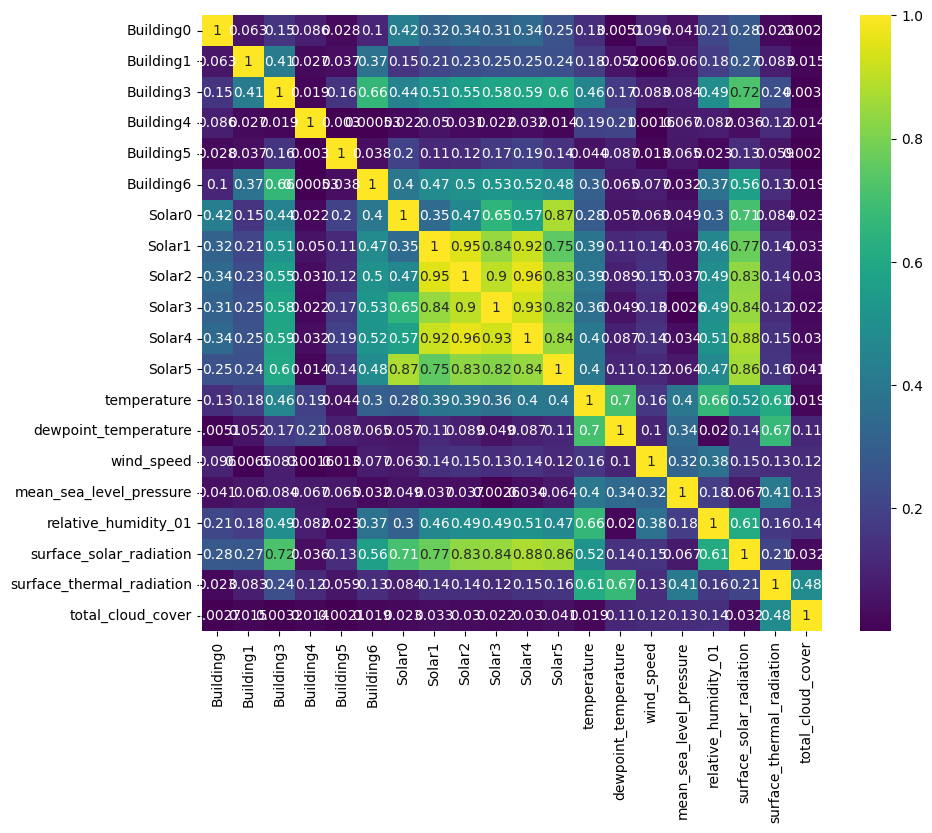

In [10]:
plt.figure(figsize = (10, 8))
sns.heatmap(corr.abs(), cmap ='viridis' , annot=True)
plt.show()

#### Encontrar las variables altamente correlacionadas

In [11]:
new_corr = corr.abs()
new_corr.loc[:,:] = np.tril(new_corr, k=-1) # below main lower triangle of an array
new_corr = new_corr.stack().to_frame('correlation').reset_index().sort_values(by='correlation', ascending=False)

In [12]:
new_corr[new_corr.correlation > 0.5]

,level_0,level_1,correlation
208,Solar4,Solar2,0.962931
167,Solar2,Solar1,0.952674
209,Solar4,Solar3,0.931928
207,Solar4,Solar1,0.921254
188,Solar3,Solar2,0.899295
350,surface_solar_radiation,Solar4,0.876595
226,Solar5,Solar0,0.874540
351,surface_solar_radiation,Solar5,0.862084
349,surface_solar_radiation,Solar3,0.842462
187,Solar3,Solar1,0.842019


#### Vemos las series temporales de los edificios y paneles

Text(0.5, 1.0, 'Building6')

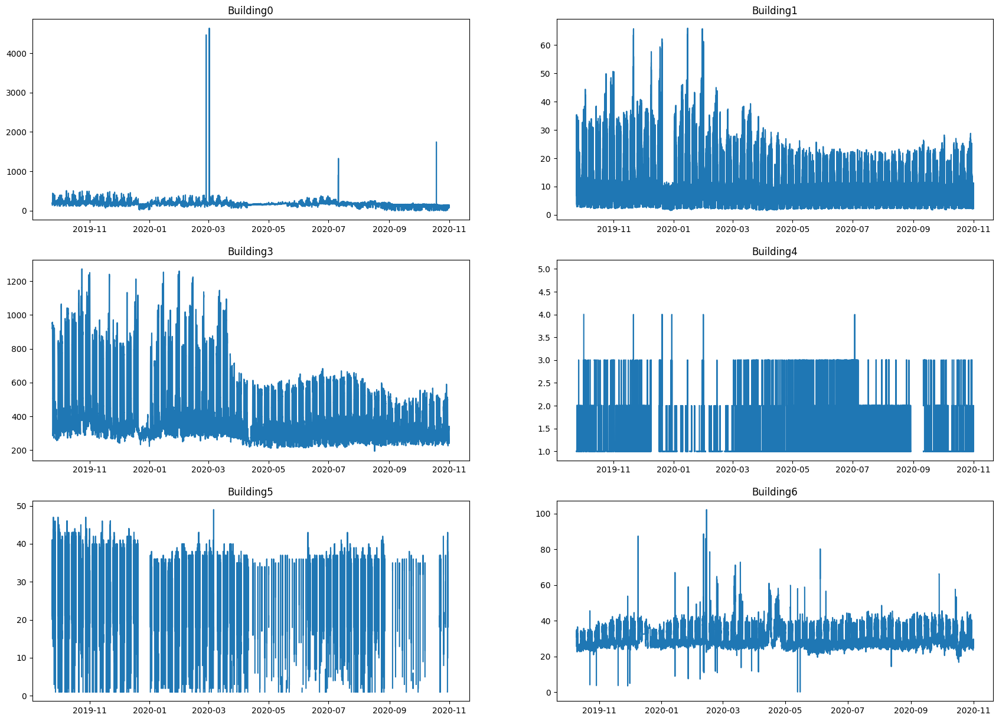

In [13]:
# Visualizamos los Buildings
fig, axs = plt.subplots(3, 2, figsize=(21, 15))
axs[0, 0].plot(phase2_df.index, phase2_df.Building0)
axs[0, 0].set_title('Building0')
axs[0, 1].plot(phase2_df.index, phase2_df.Building1)
axs[0, 1].set_title('Building1')
axs[1, 0].plot(phase2_df.index, phase2_df.Building3)
axs[1, 0].set_title('Building3')
axs[1, 1].plot(phase2_df.index, phase2_df.Building4)
axs[1, 1].set_title('Building4')
axs[2, 0].plot(phase2_df.index, phase2_df.Building5)
axs[2, 0].set_title('Building5')
axs[2, 1].plot(phase2_df.index, phase2_df.Building6)
axs[2, 1].set_title('Building6')

Text(0.5, 1.0, 'Solar5')

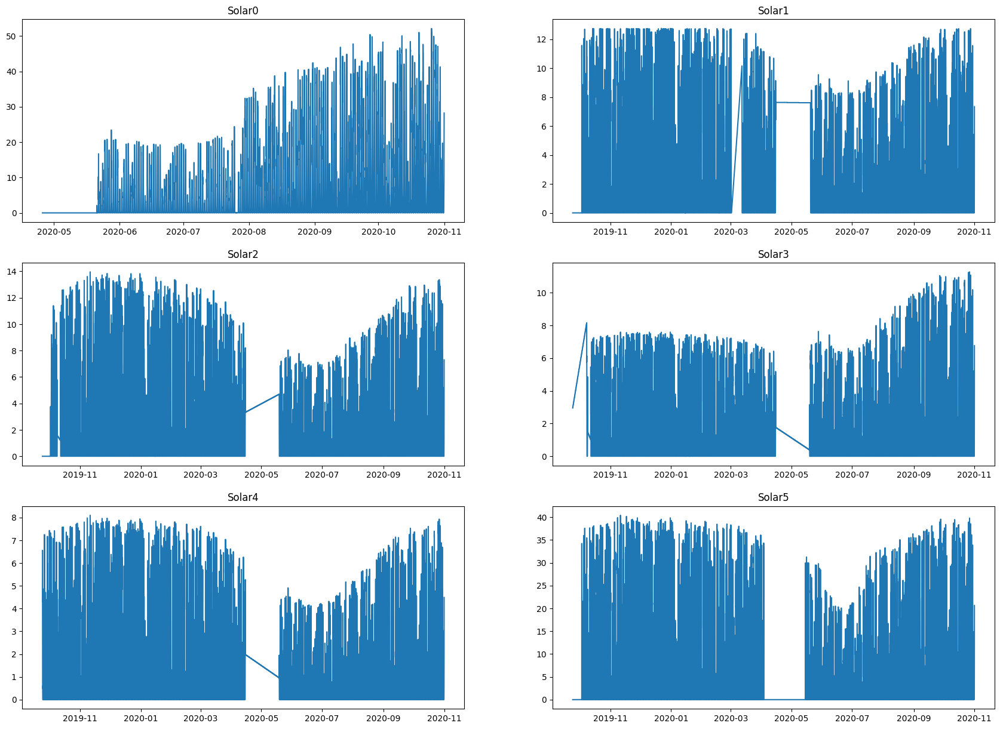

In [14]:
# Visualizamos los Solar Panels
fig, axs = plt.subplots(3, 2, figsize=(21, 15))
axs[0, 0].plot(phase2_df.index, phase2_df.Solar0)
axs[0, 0].set_title('Solar0')
axs[0, 1].plot(phase2_df.index, phase2_df.Solar1)
axs[0, 1].set_title('Solar1')
axs[1, 0].plot(phase2_df.index, phase2_df.Solar2)
axs[1, 0].set_title('Solar2')
axs[1, 1].plot(phase2_df.index, phase2_df.Solar3)
axs[1, 1].set_title('Solar3')
axs[2, 0].plot(phase2_df.index, phase2_df.Solar4)
axs[2, 0].set_title('Solar4')
axs[2, 1].plot(phase2_df.index, phase2_df.Solar5)
axs[2, 1].set_title('Solar5')

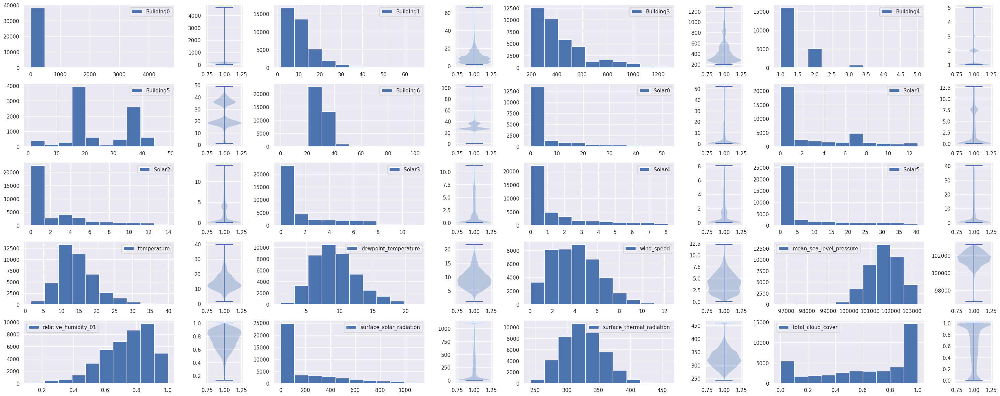

In [15]:
#Historigramas y violin plot
fig, ax = plot_histograms(
        phase2_df,
        columns=4,
    )
plt.savefig("images/histogram.png")
plt.show()

----------------------------------------------------

-------------------------------------------------------------------------

## Limpieza de datos

#### Missings

In [16]:
# Separamos los datos de Noviembre del DataFrame que vamos a tratar
Nov_df = phase2_df['2020-11-01 00:00:00':]

phase2_df = phase2_df[:'2020-10-31 23:45:00']

In [17]:
# Usamos interpolación lineal para imputar los datos nulos
phase2_df = phase2_df.interpolate('linear')

# Y los datos no registrados de las estructuras (sus registros empiezan mas tarde que el resto)
# las rellenamos con ceros
phase2_df = phase2_df.fillna(0)

#### Outliers 

In [18]:
Buildings = ['Building0', 'Building1', 'Building3', 'Building4', 'Building5', 'Building6']
Buildings_df = phase2_df[Buildings]

In [19]:
phase2_df.quantile(q = np.arange(0.01, 1, 0.49))

,Building0,Building1,Building3,Building4,Building5,Building6,Solar0,Solar1,Solar2,Solar3,Solar4,Solar5,temperature,dewpoint_temperature,wind_speed,mean_sea_level_pressure,relative_humidity_01,surface_solar_radiation,surface_thermal_radiation,total_cloud_cover
0.01,10.600,2.2,221.00,1.0,1.000000,0.0,0.0000,0.00,0.00,0.00,0.00,0.00,4.5525,3.18500,0.505,99570.38325,0.275,0.0000,261.14910,0.00
0.50,167.700,8.8,363.00,1.0,10.430328,28.2,0.0000,0.45,0.32,0.44,0.22,0.00,13.2900,8.82500,3.930,101713.32000,0.770,15.3175,321.84000,0.73
0.99,369.126,35.0,1088.18,3.0,40.000000,48.0,37.9018,12.65,12.52,9.06,7.46,37.41,29.8845,18.47295,9.330,103097.00665,0.980,980.9745,402.43885,1.00


In [20]:
# Trataremos los outliers de los Builgins usando la tecnica Winsorize.

down_quantiles = Buildings_df.quantile(0.01)
outliers_low = (Buildings_df < down_quantiles)

up_quantiles = Buildings_df.quantile(0.999)
outliers_high = (Buildings_df > up_quantiles)

Buildings_df = Buildings_df.mask(outliers_low, down_quantiles, axis=1)
Buildings_df = Buildings_df.mask(outliers_high, up_quantiles, axis=1)

#### Outliers manuales 

##### Building0

<AxesSubplot:>

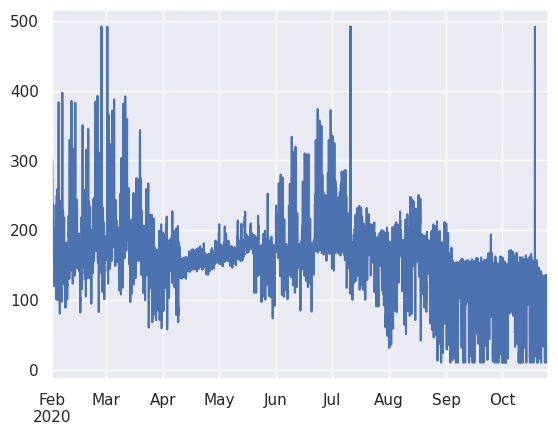

In [21]:
Buildings_df.Building0['2020-02-01' : '2020-10-25'].plot()

In [22]:
#Outliers en Julio y Octubre
Buildings_df.Building0.mask(Buildings_df.Building0['2020-07-01' : '2020-10-20'] > 400, inplace=True)

#Ourliers en Marzo
Buildings_df.Building0.mask(Buildings_df.Building0['2020-02-01' : '2020-04-01'] > 420, inplace=True)

In [23]:
RollMean_B0 = Buildings_df.Building0.rolling(window=5, min_periods=1).mean()
Buildings_df.Building0.fillna(RollMean_B0, inplace=True)

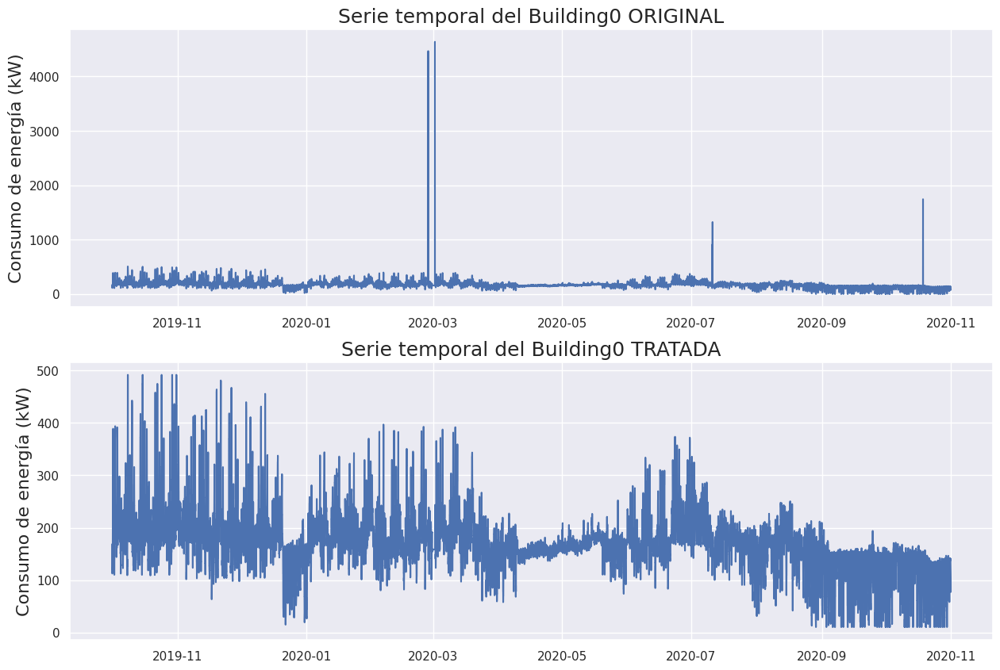

In [24]:
fig, axs = plt.subplots(2, 1, figsize=(15, 10))
axs[0].plot(phase2_df.index[-38112:], phase2_df.Building0[-38112:])
axs[0].set_title('Serie temporal del Building0 ORIGINAL', size=18)
axs[0].set_ylabel('Consumo de energía (kW)', size=16)
axs[1].plot(Buildings_df.index[-38112:], Buildings_df.Building0[-38112:])
axs[1].set_title('Serie temporal del Building0 TRATADA', size=18)
axs[1].set_ylabel('Consumo de energía (kW)', size=16)
plt.savefig('Comparación_datos_tratados.png')

In [25]:
# Llevamos los valores sin outliers al DataFrame original
df_treated = phase2_df.copy()
df_treated[Buildings] = Buildings_df[['Building0', 'Building1', 'Building3', 'Building4', 'Building5', 'Building6']]

No veo que haya outliers en los paneles solares ni en los datos climáticos

#### Feature engineering

In [26]:
# Volvemos a unir los datos de Noviembre para que obtengan las nuevas variables categoricas
df_treated = pd.concat([df_treated ,Nov_df])

In [27]:
df_treated['2020-10-31 23:30:00':'2020-11-01 00:15:00']

,Building0,Building1,Building3,Building4,Building5,Building6,Solar0,Solar1,Solar2,Solar3,Solar4,Solar5,temperature,dewpoint_temperature,wind_speed,mean_sea_level_pressure,relative_humidity_01,surface_solar_radiation,surface_thermal_radiation,total_cloud_cover
2020-10-31 23:30:00,77.6,5.1,327.0,1.0,1.0,27.4,24.56,6.73,6.35,5.83,3.85,18.29,14.2050,9.240,2.880,102392.4250,0.720,446.200,354.6450,0.9600
2020-10-31 23:45:00,77.6,7.8,327.0,1.0,1.0,27.4,28.23,7.34,7.30,6.76,4.49,20.64,14.3225,9.285,2.965,102395.5975,0.715,471.925,355.0175,0.9500
2020-11-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.4400,9.330,3.050,102398.7700,0.710,497.650,355.3900,0.9400
2020-11-01 00:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.7700,9.425,3.120,102397.9950,0.700,544.085,353.8075,0.9425


In [28]:
df_treated.index = pd.to_datetime(df_treated.index).set_names('date')

# Categorical variable for datetime
df_treated['month'] = df_treated.index.map(lambda i: i.strftime('%m'))
df_treated['day'] = df_treated.index.map(lambda i: i.strftime('%d'))
df_treated['hour'] = df_treated.index.map(lambda i: i.strftime('%H'))

# Categorical variable for covid
df_treated['COVID'] = 0
df_treated['COVID']['2020-03-01':] = 1

# Categorical variable for breaks
df_treated['Break'] = 0
df_treated['Break'][:'2020-03-01'] = np.nan
df_treated['Break']['2020-04-10':'2020-04-17'] = 1 # Mid-Semester Break
df_treated['Break']['2020-06-15':'2020-06-19'] = 1 # Swot vac
df_treated['Break']['2020-09-21':'2020-10-02'] = 1 # Mid-Semester Break
df_treated['Break']['2020-11-09':'2020-11-13'] = 1 # Swot vac

# Categorical variable for both semesters
df_treated['Semester'] = 0
df_treated['Semester'][:'2020-03-01'] = np.nan
df_treated['Semester']['2020-03-09':'2020-06-12'] = 1 # Semester 1
df_treated['Semester']['2020-08-03':'2020-11-06'] = 1 # Semester 2

# Categorical variable for exam periods
df_treated['Exams'] = 0
df_treated['Exams'][:'2020-03-01'] = np.nan
df_treated['Exams']['2020-06-22':'2020-07-10'] = 1 # Exams 1
df_treated['Exams']['2020-11-16':'2020-12-04'] = 1 # Exams 2

# Campus Occupancy in %
df_treated['Monash_occupancy'] = 1
df_treated['Monash_occupancy']['2020-06-20':'2020-07-19'] = 0.1
df_treated['Monash_occupancy']['2020-08-02':'2020-09-13'] = 0.05
df_treated['Monash_occupancy']['2020-09-13':'2020-10-18'] = 0.25
df_treated['Monash_occupancy']['2020-10-18':] = 0.3

categorical = ['COVID', 'Break', 'Semester', 'Exams', 'Monash_occupancy',
               'month', 'day', 'hour']
df_treated[categorical] = df_treated[categorical].astype('category')
df_categorical = df_treated[categorical]

print(df_treated.columns)

Index(['Building0', 'Building1', 'Building3', 'Building4', 'Building5',
       'Building6', 'Solar0', 'Solar1', 'Solar2', 'Solar3', 'Solar4', 'Solar5',
       'temperature', 'dewpoint_temperature', 'wind_speed',
       'mean_sea_level_pressure', 'relative_humidity_01',
       'surface_solar_radiation', 'surface_thermal_radiation',
       'total_cloud_cover', 'month', 'day', 'hour', 'COVID', 'Break',
       'Semester', 'Exams', 'Monash_occupancy'],
      dtype='object')


In [29]:
#Guardamos el DataFrame de Noviembre
Nov_df = df_treated['2020-11-01 00:00:00':]
Nov_df.to_csv('data/Nov_df.csv')

df_treated = df_treated[:'2020-10-31 23:45:00']

## EDA

In [30]:
#Guardamos el DataFrame tratado para usarlo en los siguientes notebooks
df_treated.to_csv('data/df_treated.csv')

In [31]:
df_hour = df_treated.resample('H').last()

In [32]:
Buildings_df = df_treated[['Building0', 'Building1', 'Building3', 'Building4', 'Building5', 'Building6']]

adf_buildings = {}

for col in Buildings_df.columns.values:
    adf_buildings[col] = [adfuller(Buildings_df[col])[1]]

In [33]:
#p-value correspondiente a cada building
adf_buildings

{'Building0': [8.56115324599069e-29],
 'Building1': [5.691772282459276e-29],
 'Building3': [1.730686152348726e-23],
 'Building4': [3.2078593923392135e-30],
 'Building5': [9.0311240261146e-29],
 'Building6': [2.7951472773174435e-14]}

Los 6 buildings poseen series temporales estacionarias

In [34]:
Solars_df = df_treated[['Solar0', 'Solar1', 'Solar2', 'Solar3', 'Solar4', 'Solar5']]

adf_solars = {}

for col in Solars_df.columns.values: 
    adf_solars[col] = adfuller(Solars_df[col])[1]

In [35]:
#p-value correspondiente a cada placa solar
adf_solars

{'Solar0': 0.0,
 'Solar1': 0.0,
 'Solar2': 0.0,
 'Solar3': 0.0,
 'Solar4': 0.0,
 'Solar5': 0.0}

Los 6 paneles solares tambien poseen series temporales estacionales

## Visualizaciones

In [36]:
with open("data/solar_production.P", "rb") as f:
        solar_production = pickle.load(f)

with open("data/phase2_df.P", "rb") as f:
        phase2_df = pickle.load(f)

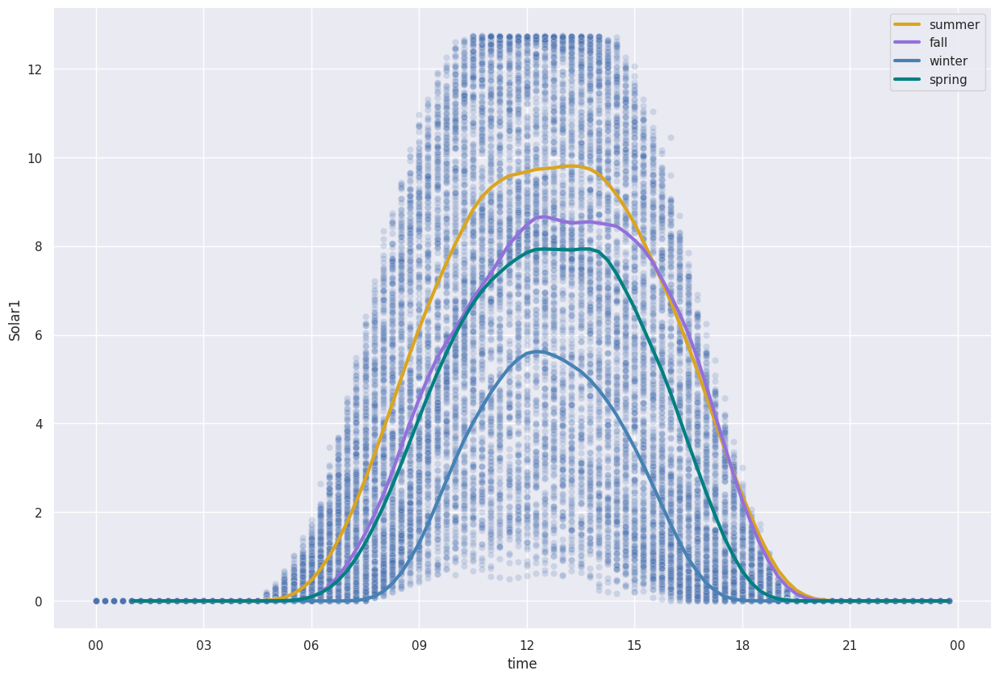

In [37]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = plot_daily(
        solar_production,
        ax=ax)

plt.savefig("images/plot_daily.png")
plt.show()

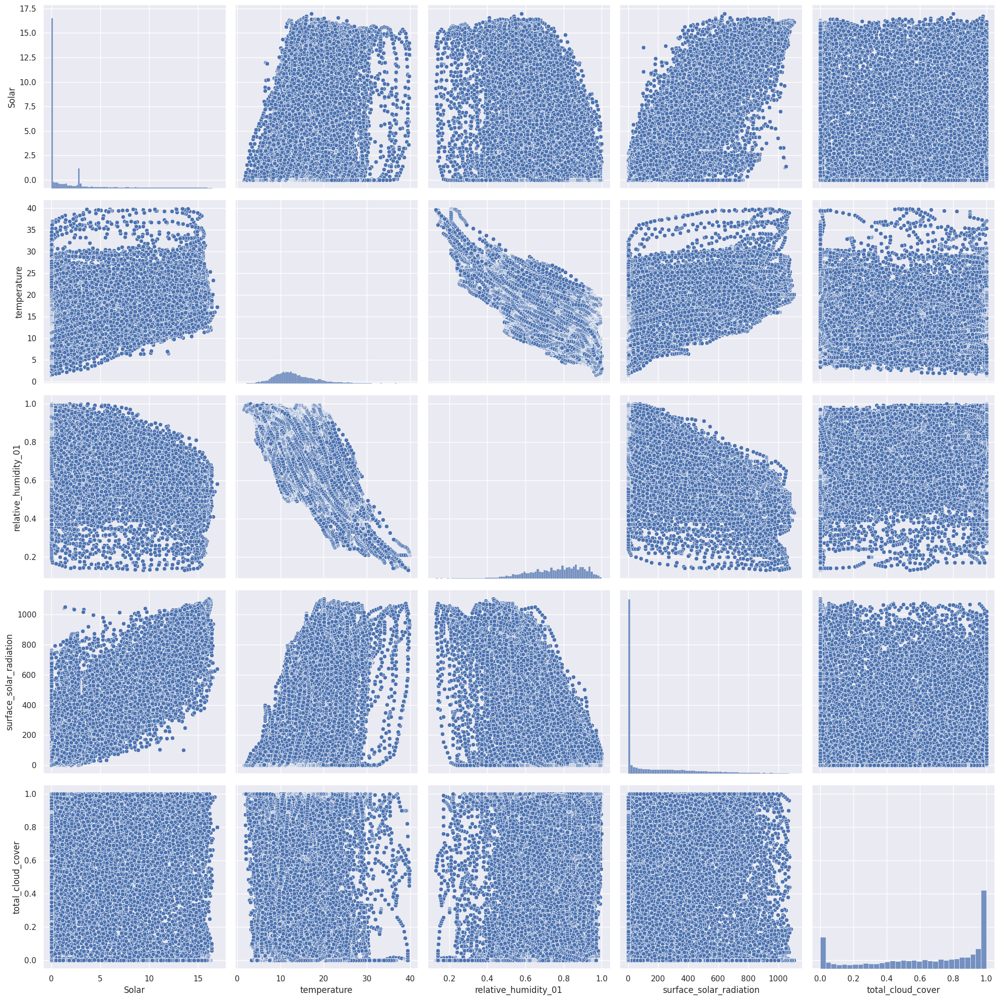

In [38]:
fig = plot_pairplot(
        phase2_df,
    )
#plt.savefig("images/pairplot.png")
plt.show()

In [39]:
variables = phase2_df.columns[-8:]
df = phase2_df.reset_index().groupby(by="index").mean()

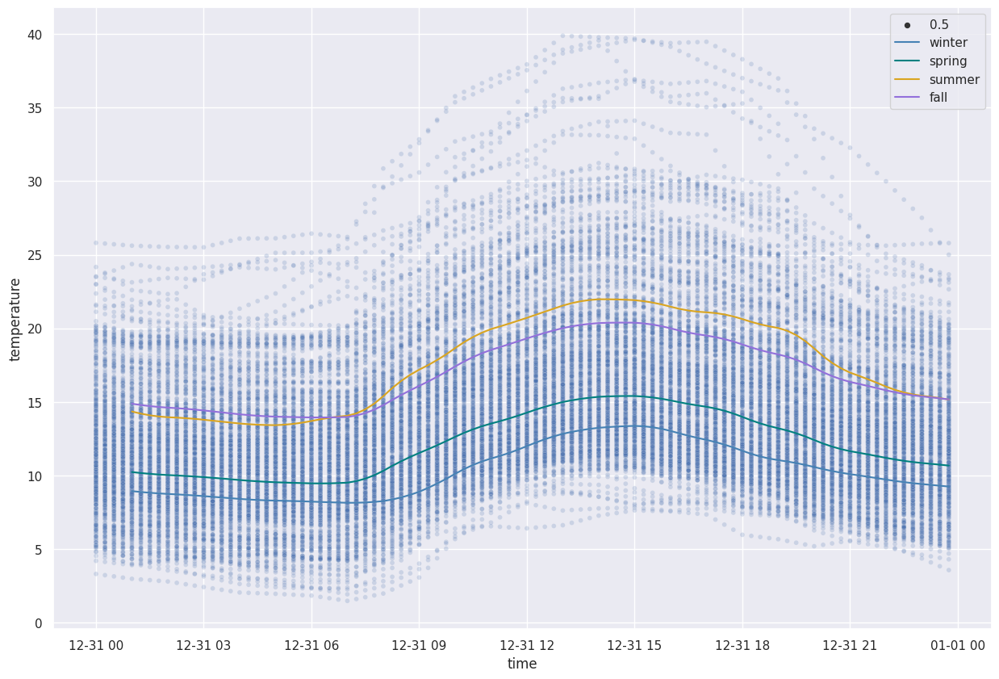

In [40]:
fig = plt.subplots(figsize=(15, 10))
ax = plot_temp_daily(df,
                     ax=ax,
                     variable=variables[0]
            )
#plt.savefig(f"images/plot_temperature_daily.png")
plt.show()

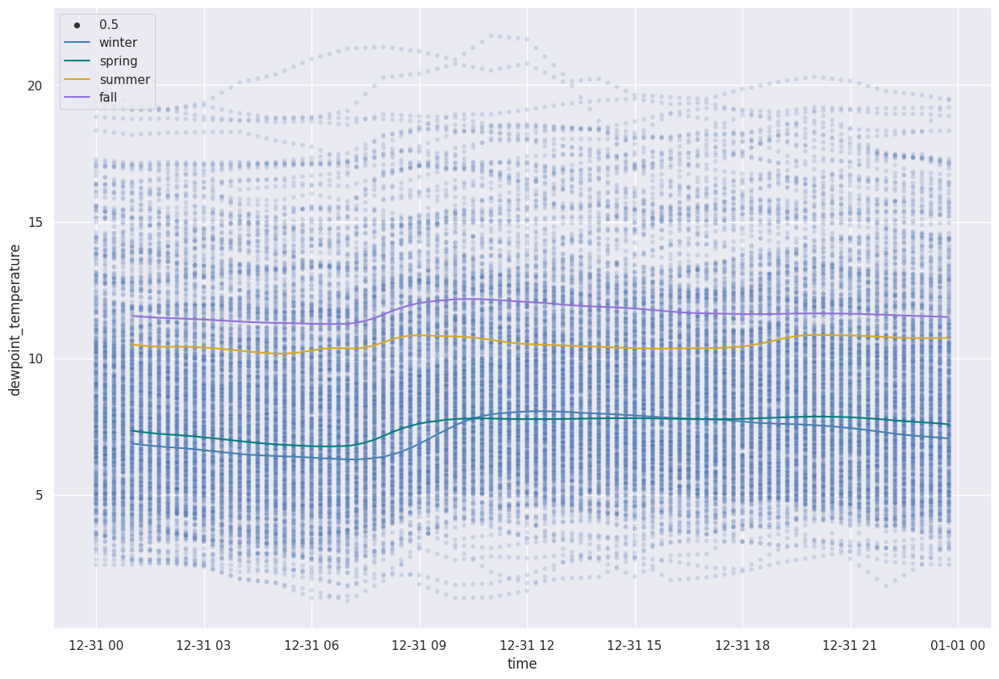

In [41]:
fig = plt.subplots(figsize=(15, 10))
ax = plot_temp_daily(df,
                     ax=ax,
                     variable=variables[1]
            )
#plt.savefig(f"images/plot_temperature_daily.png")
plt.show()

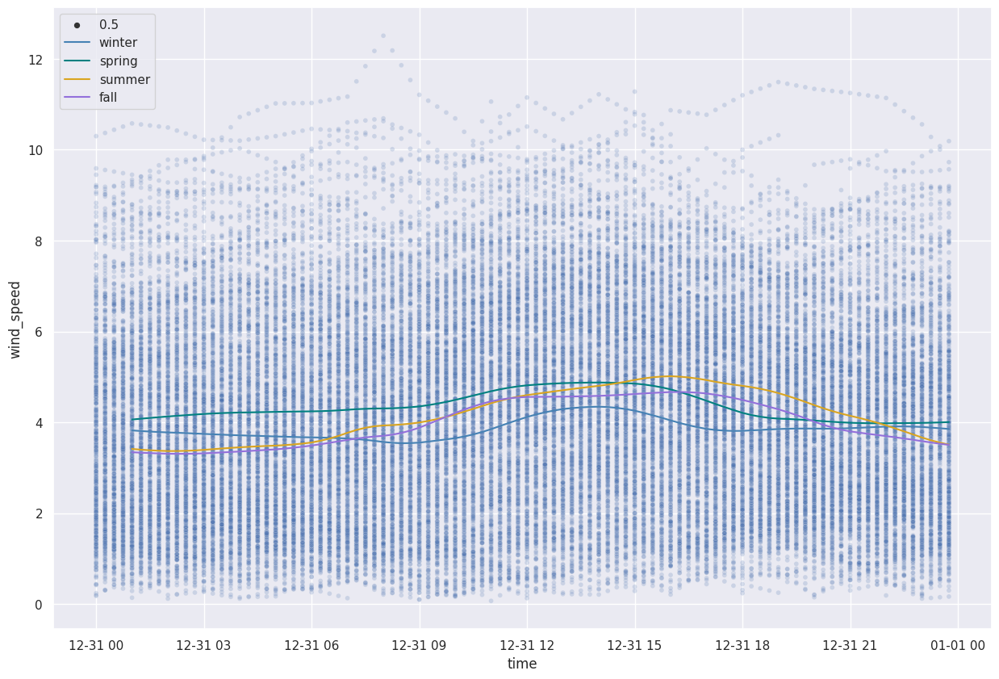

In [42]:
fig = plt.subplots(figsize=(15, 10))
ax = plot_temp_daily(df,
                     ax=ax,
                     variable=variables[2]
            )
#plt.savefig(f"images/plot_temperature_daily.png")
plt.show()

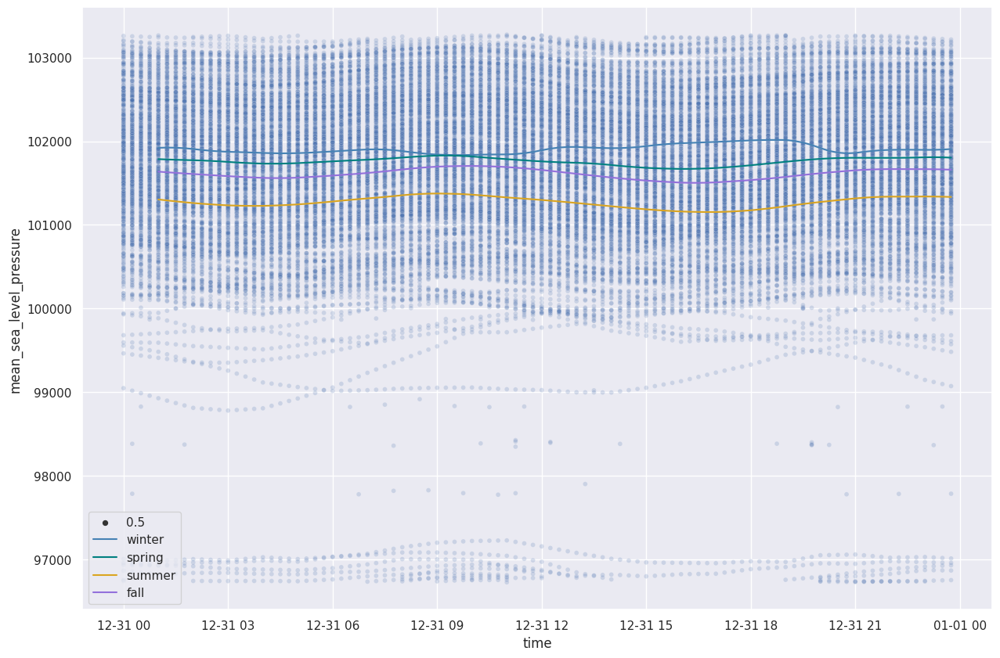

In [43]:
fig = plt.subplots(figsize=(15, 10))
ax = plot_temp_daily(df,
                     ax=ax,
                     variable=variables[3]
            )
#plt.savefig(f"images/plot_temperature_daily.png")
plt.show()

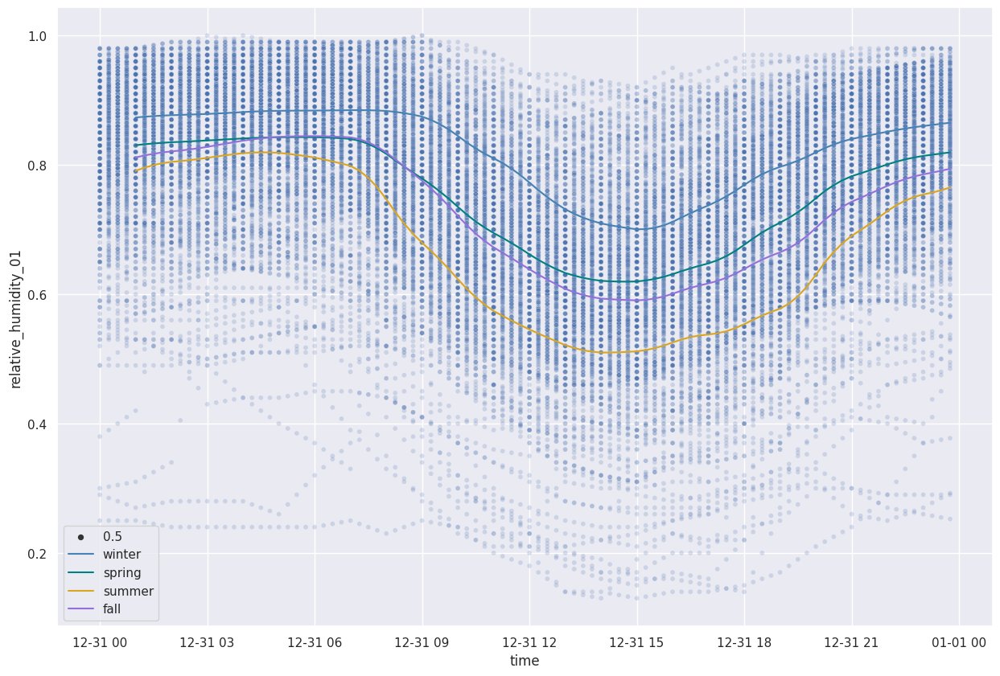

In [44]:
fig = plt.subplots(figsize=(15, 10))
ax = plot_temp_daily(df,
                     ax=ax,
                     variable=variables[4]
            )
#plt.savefig(f"images/plot_temperature_daily.png")
plt.show()

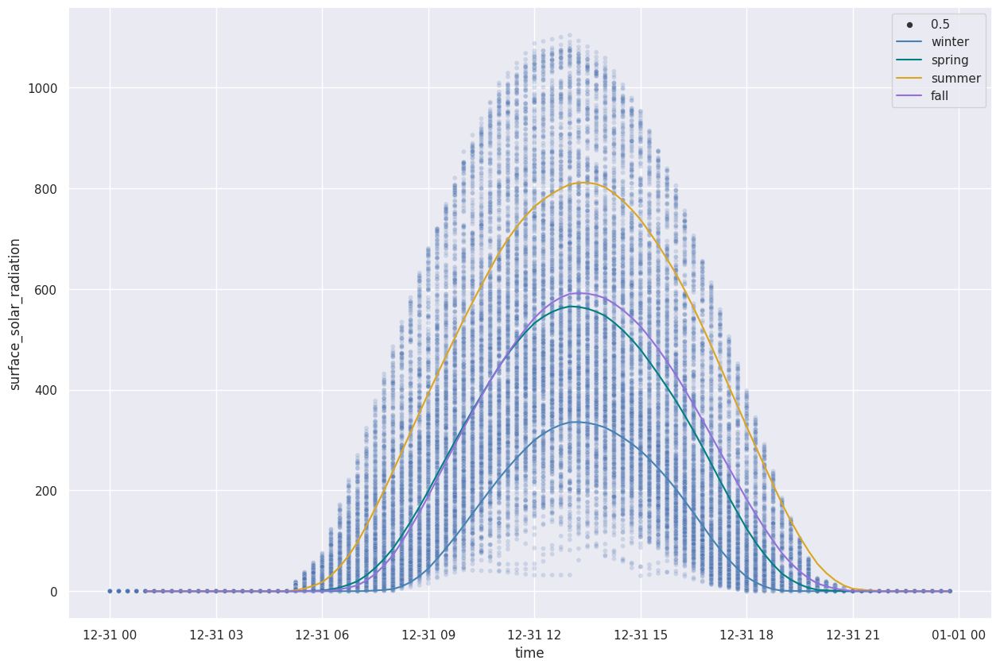

In [45]:
fig = plt.subplots(figsize=(15, 10))
ax = plot_temp_daily(df,
                     ax=ax,
                     variable=variables[5]
            )
#plt.savefig(f"images/plot_temperature_daily.png")
plt.show()

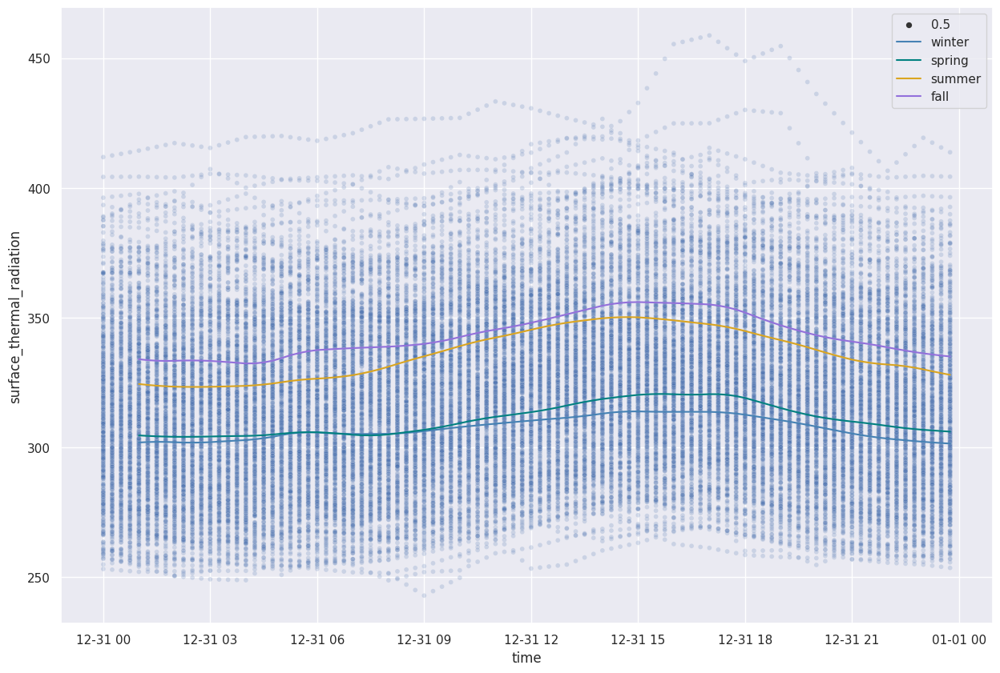

In [46]:
fig = plt.subplots(figsize=(15, 10))
ax = plot_temp_daily(df,
                     ax=ax,
                     variable=variables[6]
            )
#plt.savefig(f"images/plot_temperature_daily.png")
plt.show()

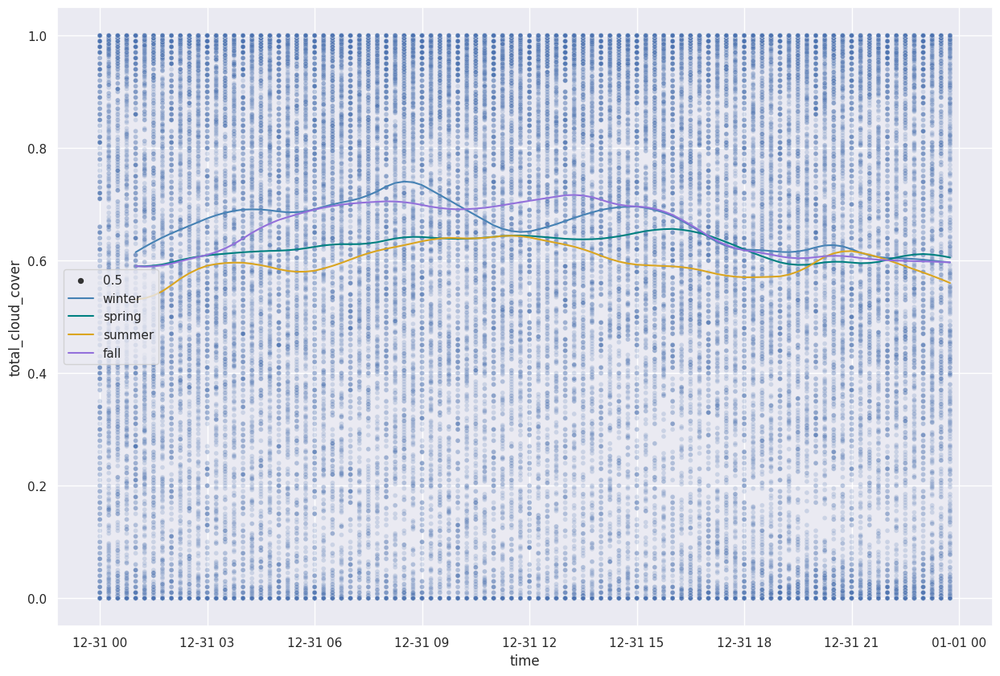

In [47]:
fig = plt.subplots(figsize=(15, 10))
ax = plot_temp_daily(df,
                     ax=ax,
                     variable=variables[7]
            )
#plt.savefig(f"images/plot_temperature_daily.png")
plt.show()

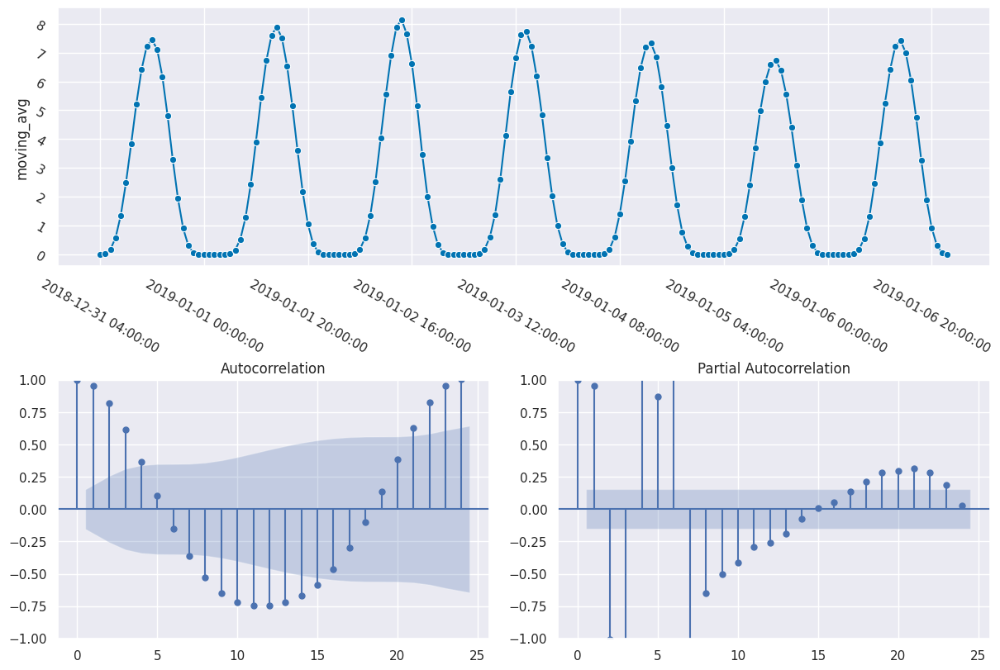

In [48]:
fig = plot_weekly_acf(solar_production)
#plt.savefig(f"images/plot_weekly_prod.png")
plt.show()

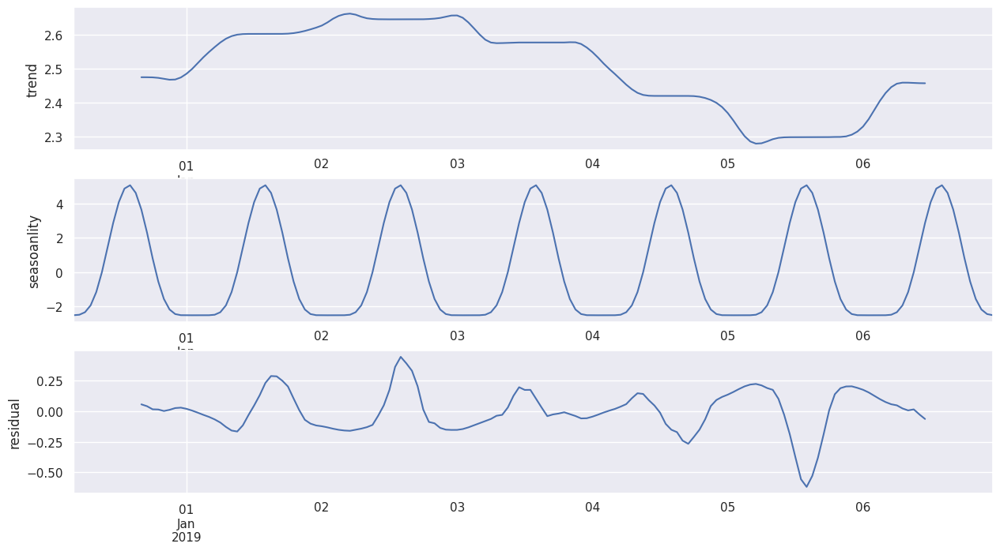

In [49]:
fig = plot_weekly_seasons_decomp(solar_production)
#plt.savefig(f"images/plot_weekly_seasonal_decomp.png")
plt.show()

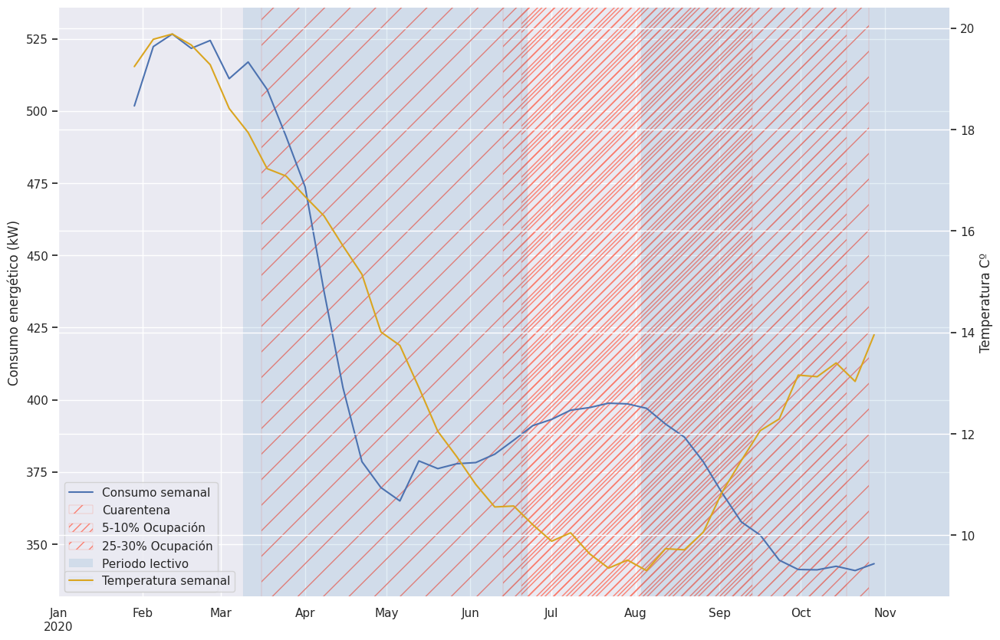

In [50]:
fig = plot_2020_demand(
            df=phase2_df
        )
plt.savefig("images/demand_2020.png")
plt.show()

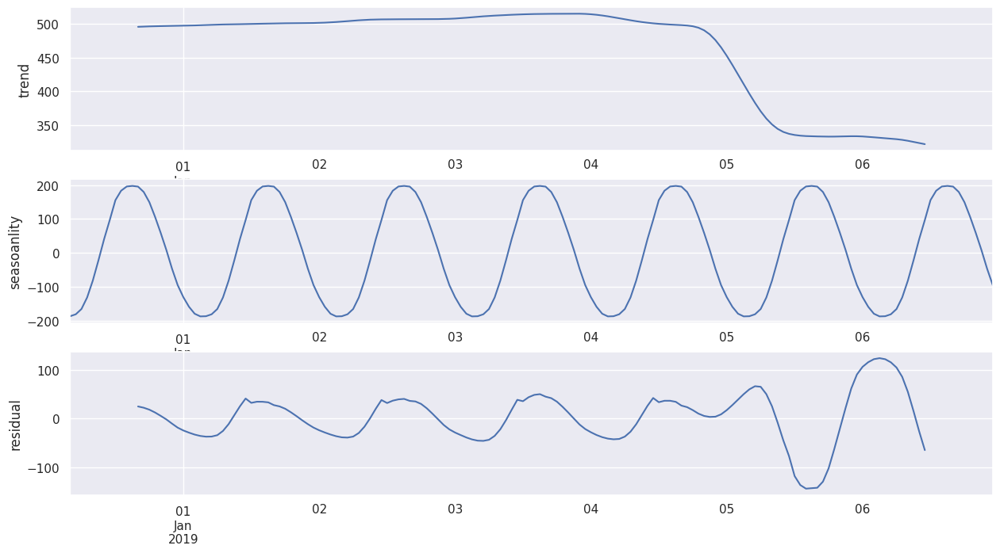

In [51]:
fig = plot_weekly_seasons_decomp_build3(
            df=phase2_df
        )
plt.savefig("images/weekly_build3.png")
plt.show()

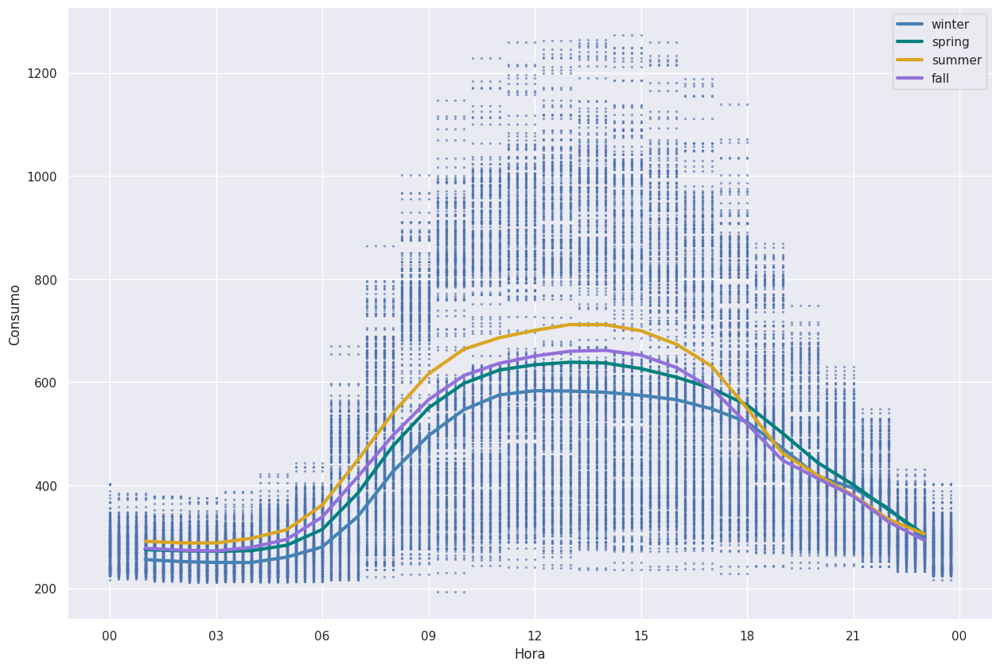

In [52]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = plot_daily_building3(phase2_df, ax)
plt.savefig("images/daily_build3.png")
plt.show()

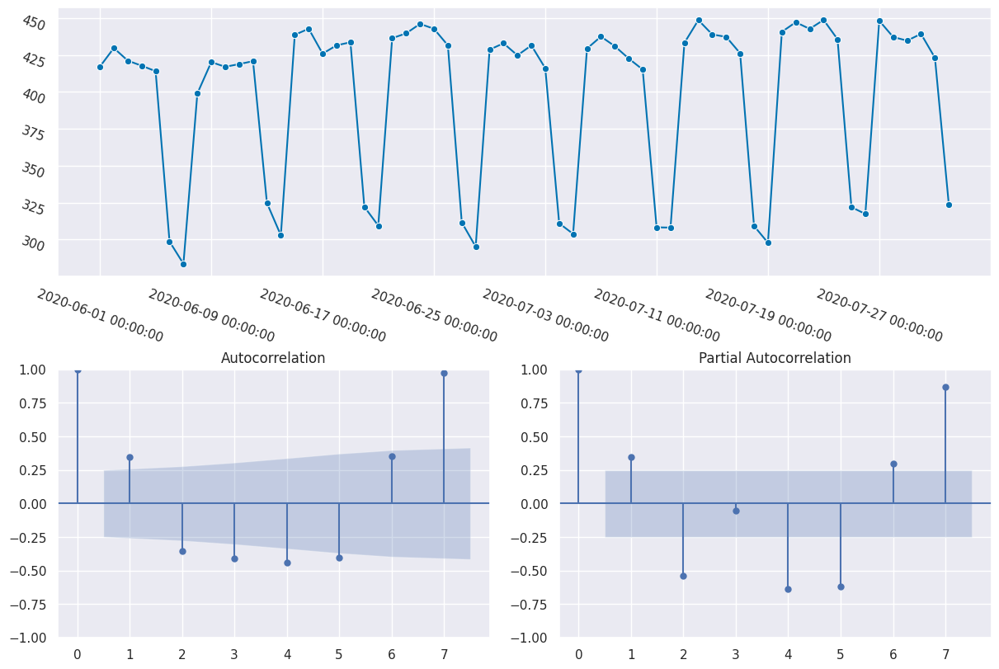

In [53]:
ax = plot_month_acf(phase2_df)
plt.savefig("images/monthly_acf.png")
plt.show()

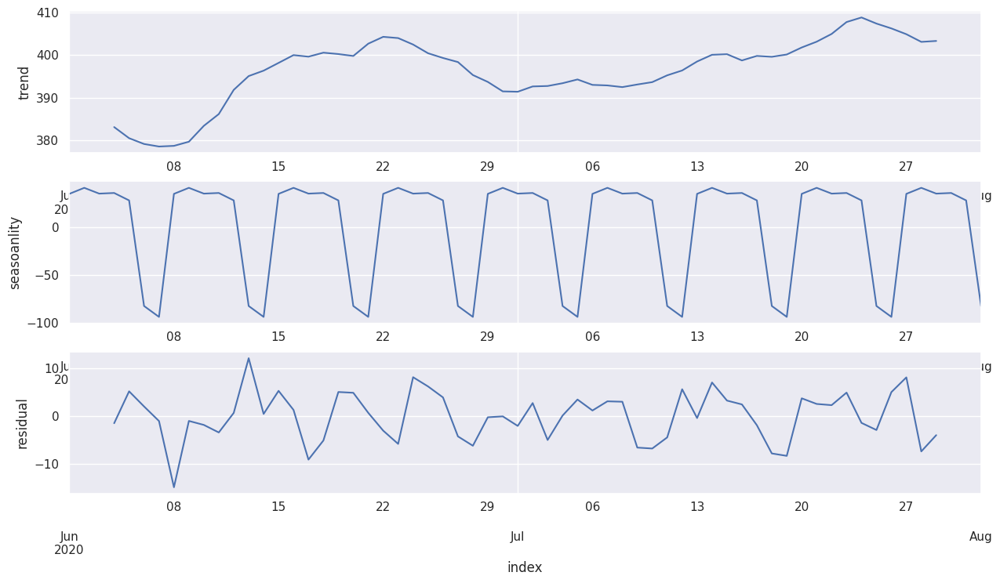

In [54]:
fig = plot_month_seasonality(phase2_df)
plt.savefig("images/monthly_seasonality.png")